In [1]:
import os
import sys
sys.path.append("../")

import numpy as np
from pandas import Series
from imageio import (imread, imwrite)
import matplotlib.pylab as plt
%matplotlib inline

from Random_utils import (
        reverse_dict, onehottify)
from data_management import (
    get_fov_bounds, get_imindices_str)

import cv2
import pydensecrf.densecrf as dcrf
from pydensecrf.utils import (
    unary_from_labels, unary_from_softmax, 
    create_pairwise_bilateral, create_pairwise_gaussian)
from skimage import (data, color, img_as_bool)
from skimage.filters import threshold_otsu, gaussian
from skimage.transform import resize
from skimage.feature import peak_local_max
from skimage.morphology import watershed
from skimage.measure import regionprops
from scipy import ndimage
from matplotlib.colors import ListedColormap
import hickle as hkl

In [3]:
# Methods

In [4]:
def get_nuclei_from_region_prior(region_prior, htx, do_threshold= True):
    """
    given a region prior and hematoxylin channel, gets 
    nucleus segmentation
    args:
        region_prior - ndarray, 0,1 binary segmentation 
        htx - hematoxylin from deconvolution, np array (continuous)
    """
    soft_segmentation = region_prior * htx
    nuclei_soft = (region_prior * soft_segmentation) / 255
    
    if do_threshold:
        try:
            thresh = threshold_otsu(soft_segmentation[soft_segmentation > 0])
        except ValueError: # all values are zero
            thresh = 0
        nuclei_hard = region_prior * (soft_segmentation > thresh)
        return nuclei_soft, nuclei_hard
    else:
        return nuclei_soft

In [5]:
def FC_CRF(pred, im, NLABELS, RESIZE_FACTOR= 5, 
           DELTA_COL= 5, DELTA_SIZE= 5, n_steps=10,
           CERTAINTY= 0.7, mode= "multilabel"):
    """
    Fully Connected Conditional Random Fields
    See: 
    1- https://github.com/lucasb-eyer/pydensecrf (./examples/Non RGB Example.ipynb)
    2- http://warmspringwinds.github.io/tensorflow/tf-slim/2016/12/18/ ...
       image-segmentation-with-tensorflow-using-cnns-and-conditional-random-fields/

    Add (non-RGB) pairwise term 
    For example, in image processing, a popular pairwise relationship is the "bilateral" one, 
    which roughly says that pixels with either a similar color or a similar location are likely to 
    belong to the same class.
    """
    assert mode in ["multilabel", "prob"]

    (H0,W0) = im.shape[:2]
    H, W = (H0 // RESIZE_FACTOR, W0 // RESIZE_FACTOR)

    # regions RGB -- resize for efficiency
    image = cv2.resize(im, (W, H))

    # region labels -- note that cv2 is the only library I found
    # that downsizes without changing range of labels (which is 
    # obviously important for segmentation masks where values have meaning)
    labels0 = cv2.resize(pred, (W, H), interpolation=cv2.INTER_NEAREST)
    labels0 = (np.array(labels0)).astype('uint8')

    # The input should be the negative of the logarithm of probability values
    # Look up the definition of the softmax_to_unary for more information
    unary = unary_from_labels(
        labels= labels0, n_labels=NLABELS-1, 
        gt_prob= CERTAINTY, zero_unsure=True)

    # The inputs should be C-continious -- we are using Cython wrapper
    unary = np.ascontiguousarray(unary)
    d = dcrf.DenseCRF(H * W, NLABELS-1)
    d.setUnaryEnergy(unary)

    # NOTE: THE ORDER OF THE FOLLOWING TWO OPS
    # (create_pairwise_bilateral and create_pairwise_gaussian)
    # MAKES A DIFFERENCE !!!

    # This creates the color-dependent features --
    # because the segmentation that we get from CNN are too coarse
    # and we can use local color features to refine them
    feats = create_pairwise_bilateral(
        sdims=(DELTA_COL, DELTA_COL), schan=(20, 20, 20),
        img=image, chdim=2)
    d.addPairwiseEnergy(feats, compat=10,
                         kernel=dcrf.DIAG_KERNEL,
                         normalization=dcrf.NORMALIZE_SYMMETRIC)

    # This potential penalizes small pieces of segmentation that are
    # spatially isolated -- enforces more spatially consistent segmentations
    feats = create_pairwise_gaussian(
        sdims=(DELTA_SIZE, DELTA_SIZE), shape=(H, W))
    d.addPairwiseEnergy(feats, compat=3,
                        kernel=dcrf.DIAG_KERNEL,
                        normalization=dcrf.NORMALIZE_SYMMETRIC)

    # do inference
    Q = d.inference(n_steps)
    res = 1 + np.argmax(Q, axis=0).reshape((H, W))

    # resize back up to original
    res = cv2.resize(res, (W0, H0), interpolation=cv2.INTER_NEAREST)
    res = (np.array(res)).astype('uint8')
    return res

{'background': 0, 'tumor': 1, 'stroma': 2, 'lymphocyte': 3, 'necrosis': 4, 'plasma_cells': 10, 'other_immune': 11, 'other': 21}
{'background': 0, 'tumor': 1, 'stroma': 2, 'lymphocyte': 3, 'plasma_cells': 4, 'other_immune': 5, 'necrosis': 6, 'other': 7}
{0: 0, 1: 1, 2: 2, 3: 3, 4: 6, 10: 4, 11: 5, 21: 7}


In [6]:
def occupy_full_GT_range(pred, n_classes):
    """occupy full GT range"""
    pred[0:n_classes,0] = np.arange(n_classes)
    return pred

folder /mnt/Tardis/MohamedTageldin/TCGA_dataset/nucleus_segmentation_from_region_priors/ already exists! moving on.
folder /mnt/Tardis/MohamedTageldin/TCGA_dataset/nucleus_segmentation_from_region_priors/visualization/ already exists! moving on.
folder /mnt/Tardis/MohamedTageldin/TCGA_dataset/input_for_mrcnn/ already exists! moving on.
folder /mnt/Tardis/MohamedTageldin/TCGA_dataset/input_for_mrcnn/images/ already exists! moving on.
folder /mnt/Tardis/MohamedTageldin/TCGA_dataset/input_for_mrcnn/labels/ already exists! moving on.


In [7]:
def create_dir(folderpath):
    try:
        os.mkdir(folderpath)
    except FileExistsError:
        print("folder %s already exists! moving on." % (folderpath))

In [8]:
def get_shuffled_cmap(pltcmap= plt.cm.viridis, ncolors= 10000):
    """
    A random colormap for matplotlib -- shuffle viridis cmap
    see: https://gist.github.com/jgomezdans/402500
    """
    vals = np.linspace(0,1,ncolors)
    np.random.shuffle(vals)
    cmap_vals = pltcmap(vals)
    cmap_vals[0,...] = [0, 0, 0, 1]
    cmap = ListedColormap(cmap_vals)
    return cmap


slide 0 of 106: TCGA-A1-A0SP-DX1_xmin6798_ymin53719_.png


In [9]:
def visualize_nuclei(im, instance_mask, labels_mask, cmaps, 
                    alpha_im= 0.7, alpha_nuclei= 1.0,  
                    figsize=(15,15), savename= None, show= True):
    """
    visualize instance and mask information
    """
    def _show_cls(classlbl=1, cmap_to_use= plt.cm.viridis):
        # mask background so you can overlay
        this_cls = np.ma.masked_where(
            labels_mask != classlbl, instance_mask)
        # now show
        plt.imshow(
            this_cls, alpha=alpha_nuclei, interpolation=None, cmap= cmap_to_use)
    
    # ground work
    unique_nuclei_labels = np.unique(labels_mask)
    
    plt.figure(figsize=figsize)
    plt.imshow(im, alpha=alpha_im)
    for cno in unique_nuclei_labels:
        if cno == 0:
            continue
        _show_cls(classlbl = cno, cmap_to_use = cmaps[cno])
    if savename:
        plt.savefig(savename, format='tif', dpi=300, bbox_inches='tight')
    if show:
        plt.show()

	Reading image data and initial processing ...


Text(0.5,1,'Regions')

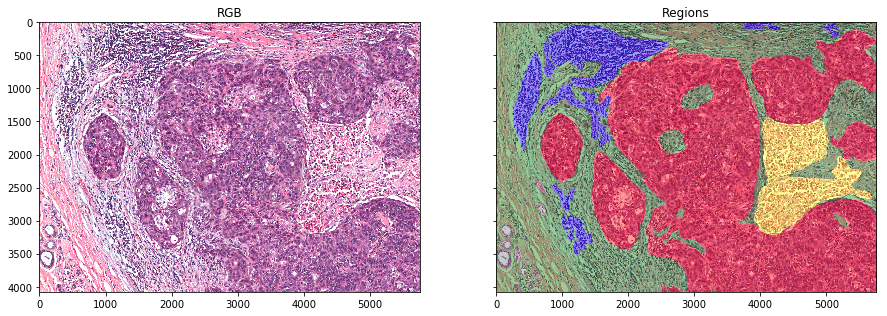

In [11]:
# Paths and params

In [12]:
base_data_path = "C:/Users/tageldim/Desktop/WSI_Segmentation/Data/TCGAdataset/"
imagepath = base_data_path + "TCGA_TNBC_rgbImages/ductal_normalized/"
labelpath = base_data_path + "TCGA_TNBC_2018-02-26/masks/core_set_151_slides/"
hematoxylinpath = base_data_path + "seeds/seed_labels/hematoxylin/"
ext_imgs= ".png"
ext_lbls= ".png"

mask_save_path = base_data_path + "nucleus_segmentation_from_region_priors/"
mask_vis_save_path = mask_save_path + "visualization/"
input_for_maskrcnn_path = base_data_path + "input_for_mrcnn/"
input_for_maskrcnn_path_images = input_for_maskrcnn_path + "images/"
input_for_maskrcnn_path_labels = input_for_maskrcnn_path + "labels/"

	FC-CRF to Refining region boundaries with CF-CRF ...


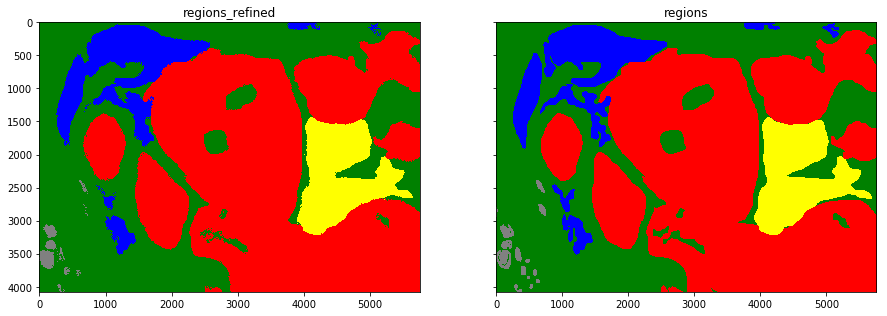

<Figure size 432x288 with 0 Axes>

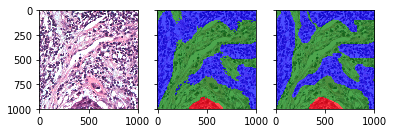

<Figure size 432x288 with 0 Axes>

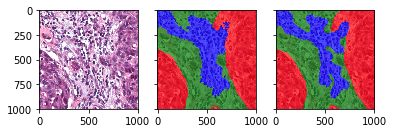

<Figure size 432x288 with 0 Axes>

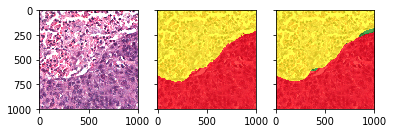

In [13]:
# %%===========================================================================
# visualize    
# =============================================================================

regions_disp = occupy_full_GT_range(regions, n_classes)
regions_refined_disp = occupy_full_GT_range(regions_refined, n_classes)

# visualize result
# ------------------
f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15, 15))
ax1.imshow(regions_refined_disp, cmap= cmap_classlabels)
ax1.set_title('regions_refined')
probability_graph = ax2.imshow(regions_disp, cmap= cmap_classlabels)
ax2.set_title('regions')
plt.show()

# visualize subregions
# ---------------------
snapshots = [(500, 500, 1500, 1500), 
             (1000, 1000, 2000, 2000),
             (2500, 4000, 3500, 5000),
            ]
for snapshot in snapshots:  
    (rmin, cmin, rmax, cmax) = snapshot
    
    # occupy full GT range
    regions_refined_slice = occupy_full_GT_range(regions_refined[rmin:rmax,cmin:cmax], n_classes)
    regions_slice = occupy_full_GT_range(regions[rmin:rmax,cmin:cmax], n_classes)
    
    plt.figure()
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
    ax1.imshow(im[rmin:rmax,cmin:cmax])
    ax2.imshow(im[rmin:rmax,cmin:cmax])
    ax2.imshow(regions_refined_slice, cmap= cmap_classlabels, alpha=0.7, interpolation=None)
    ax3.imshow(im[rmin:rmax,cmin:cmax])
    ax3.imshow(regions_slice, cmap= cmap_classlabels, alpha=0.7, interpolation=None)

In [14]:
# %%===========================================================================
# Get nucleus sugmentation/class using region priors and hematoxylin channel    
# =============================================================================

print("\tGetting nucleus segmentation and class ...")

# init nuclei semantic label channel -- init with region
# segmentation (labels 0, 1, 2, 3 ...) and multiply 
# by binary nucleus segmentation to convert to nucleus
# semantic labelling. The final result is a mask
# similar to region mask but for nuclei
nuclei_labels_init = regions.copy()
unique_regions = list(np.unique(regions))

for c in unique_regions:
    
    if c == 0: # don't segment background
        continue
        
    nuclei_labels_init[regions == c] = c

    # nucleus segmentation using htx channel and region prior
    _, nuclei_hard = get_nuclei_from_region_prior(
        0 + (regions == c), htx, do_threshold= True)
    # assign label based on region prior -- everythign outside region is zero
    nuclei_thisregion = (0 + (nuclei_labels_init == c)) * nuclei_hard * c
    # superimpose
    nuclei_labels_init[nuclei_labels_init == c] = 0
    nuclei_labels_init = nuclei_labels_init + nuclei_thisregion

	Getting nucleus segmentation and class ...


Text(0.5,1,'Nuclei class')

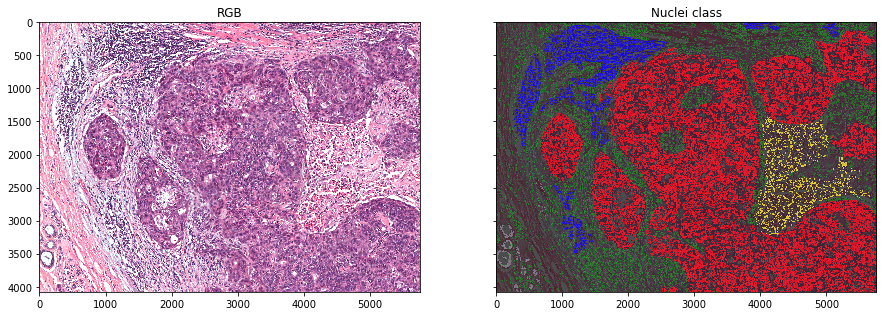

In [15]:
# %%===========================================================================
# visualize    
# =============================================================================

# occupy full GT range
nuclei_disp = occupy_full_GT_range(nuclei_labels_init, n_classes)

f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(15, 15))
ax1.imshow(im); ax1.set_title("RGB")
ax2.imshow(im); 
ax2.imshow(nuclei_disp, alpha=0.7, interpolation=None, cmap=cmap_classlabels); 
ax2.set_title("Nuclei class")

In [16]:
# clear space
del regions
del regions_refined

In [17]:
# %%===========================================================================
# Connected components and cleanup    
# =============================================================================

print("\tGetting connected components ...")

min_pixels = 300 # lymphocytes are at least this 300 pixels in area
smooth_sigma_default = 5
smooth_sigma_lymphocyte = 2

# for convenience
unique_nuclei_labels = np.unique(nuclei_labels_init)

# add a channel that will encode instance membership
# i.e. nuclei matrix contains two channels: first one encodes label
# while second channel encodes instance membership
nuclei = np.zeros(nuclei_labels_init.shape + (2,))

for cno in unique_nuclei_labels:
    c = codes_new_reverse[cno]
    
    if "backgr" in c:
        continue
    
    # isolate nuclei belonging to this class
    labels = 0 + (nuclei_labels_init == cno)
    
    # if there's no/negligible nuclei ignore
    if np.sum(labels) < min_pixels:
        continue
    print("\t\t%s" % (c))
    
    # Gaussian smoothing followed by otsu thresholding
    # to get rid of artifacts and small regions
    if "lymphocyte" in c:
        sigma = smooth_sigma_lymphocyte
    else:
        sigma = smooth_sigma_default
    labels = gaussian(labels, sigma=sigma, output=None, mode='nearest', preserve_range=True)
    otsu_val = threshold_otsu(labels[labels > 0])
    labels = 0 + (labels > otsu_val)

    # compute the exact Euclidean distance from every binary
    # pixel to the nearest zero pixel, then find peaks in this
    # distance map
    labels = labels * 255 # scipy prefers 255
    D = ndimage.distance_transform_edt(labels)
    localMax = peak_local_max(
        D, indices=False, min_distance=10, labels=labels)
    # perform a connected component analysis on the local peaks,
    # using 8-connectivity, then appy the Watershed algorithm
    markers = ndimage.label(localMax, structure=np.ones((3, 3)))[0]
    labels = watershed(-D, markers, mask=labels)
    del (D, localMax, markers)

    # filter very small connectd regions (artifacts)
    unique, counts = np.unique(labels, return_counts=True)
    discard = unique[counts < min_pixels]
    labels[np.isin(labels, discard)] = 0
        
    # assign to label channel after all this smoothing and cleanup
    idxs_thislbl = labels.copy()[..., None]
    idxs_thislbl = np.argwhere(idxs_thislbl > 0)
    nuclei[idxs_thislbl[..., 0], idxs_thislbl[..., 1], idxs_thislbl[..., 2]] = cno
    
    # now assign to instance mask
    # making sure instance labels are unique
    # and dont repeat any from previous classes
    max_instance = np.max(nuclei[..., 1])
    labels = labels + max_instance
    nuclei[..., 1] = nuclei[..., 1] + labels

	Getting connected components ...
		tumor
		stroma
		lymphocyte
		necrosis
		other


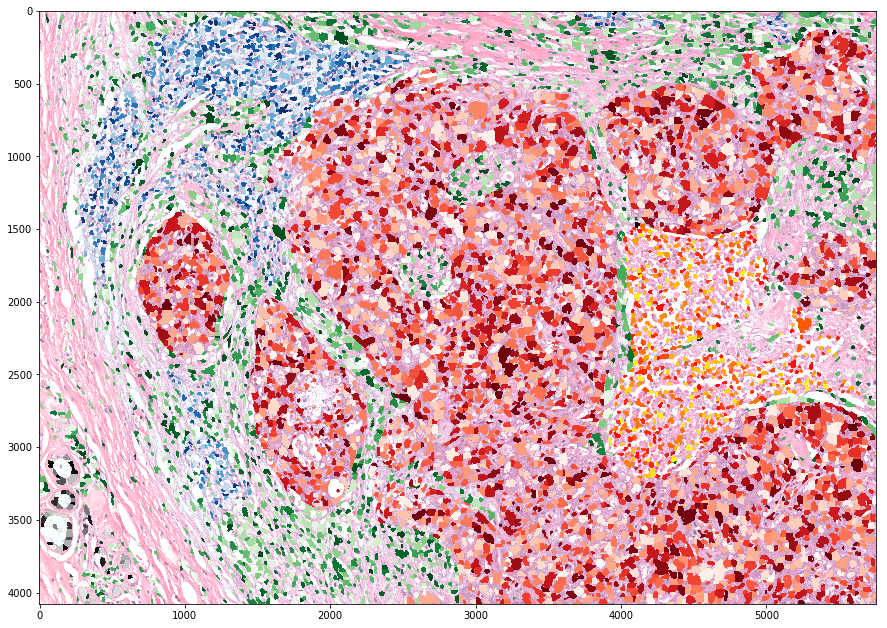

In [18]:
# %%===========================================================================
# visualize overall
# =============================================================================

visualize_nuclei(im= im, instance_mask= nuclei[..., 1], labels_mask= nuclei[..., 0], 
                 cmaps= cmaps, figsize=(15,15))

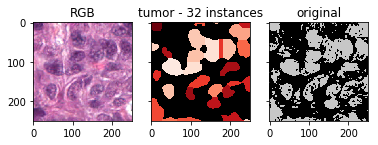

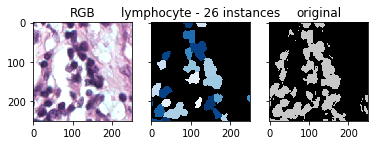

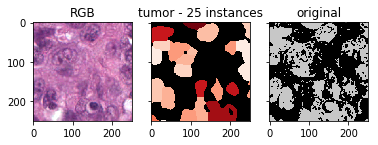

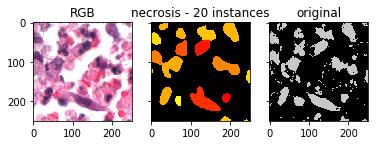

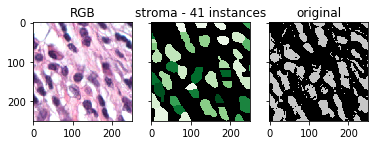

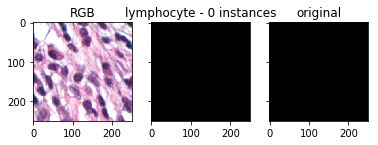

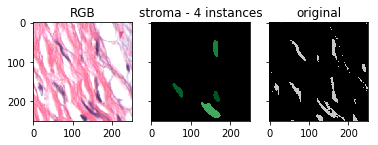

In [19]:
# %%===========================================================================
# visualize upclose
# =============================================================================

snapshots = [((3250, 3250, 3500, 3500), "tumor"),
             ((500, 500, 750, 750), "lymphocyte"),
             ((3250, 4750, 3500, 5000), "tumor"),
             ((2500, 4000, 2750, 4250), "necrosis"),
             ((3500, 1500, 3750, 1750), "stroma"),
             ((3500, 1500, 3750, 1750), "lymphocyte"),
             ((3000, 500, 3250, 750), "stroma"),
            ]

for snapshot in snapshots:  
    (rmin, cmin, rmax, cmax) = snapshot[0]
    classname = snapshot[1]
    im_slice = im[rmin:rmax, cmin:cmax, :]
    lbl_slice_original = nuclei_labels_init[rmin:rmax, cmin:cmax] == codes_new[classname]
    
    thislabel = 0 + (nuclei[rmin:rmax, cmin:cmax, 0] == codes_new[classname])
    lbl_slice = nuclei[rmin:rmax, cmin:cmax, 1] * thislabel
    
    # use contiguous labels for better plotting
    lbl_disp = np.zeros(lbl_slice.shape)
    instances = list(np.unique(lbl_slice))
    for i,j in enumerate(instances):
        lbl_disp[lbl_slice == j] = i
        
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
    ax1.imshow(im_slice); ax1.set_title('RGB')
    ax2.imshow(lbl_disp, cmap=cmaps[codes_new[classname]]); 
    ax2.set_title("%s - %d instances" % (classname, len(instances)-1)) # zero is not an instance :)
    ax3.imshow(lbl_slice_original, cmap=cmap); ax3.set_title("original") 
    plt.show()

In [20]:
# save snapshot to visualize improvement
nuclei_intermediate = nuclei.copy()

In [21]:
# %%===========================================================================
# visualize features to vet stroma nuclei
# =============================================================================

# NOTICE THE FOLLOWING PROBLEMS:
# 1- lymphocytes in stromal regions are labeled as stroma cells (fibroblasts) -- of course, since they get their labels from the region
# 2- clumped nuclei are detected together as one object
# 3- some artifacts exist (minor and few)
# So let's do some visualizations of features to help us handle some of these problems ...

classname = "stroma"

(rmin, cmin, rmax, cmax) = (3500, 1500, 3750, 1750)
im_slice1 = im[rmin:rmax, cmin:cmax, :]
thislabel = 0 + (nuclei[rmin:rmax, cmin:cmax, 0] == codes_new[classname])
lbl_slice1 = nuclei[rmin:rmax, cmin:cmax, 1] * thislabel

(rmin, cmin, rmax, cmax) = (3000, 500, 3250, 750)
im_slice2 = im[rmin:rmax, cmin:cmax, :]
thislabel = 0 + (nuclei[rmin:rmax, cmin:cmax, 0] == codes_new[classname])
lbl_slice2 = nuclei[rmin:rmax, cmin:cmax, 1] * thislabel

# Exctact features for all instances
# see: https://en.wikipedia.org/wiki/Shape_factor_(image_analysis_and_microscopy)
# and: http://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.regionprops
props1 = regionprops(label_image= np.int32(lbl_slice1), coordinates='rc')
props2 = regionprops(label_image= np.int32(lbl_slice2), coordinates='rc')

/home/mohamedt/.conda/envs/maskrcnn/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


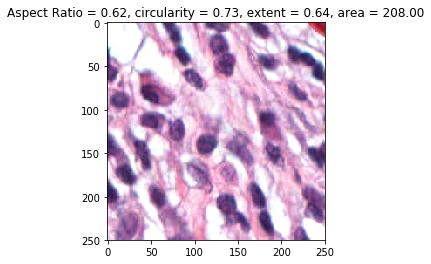

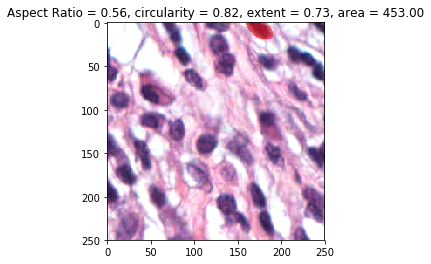

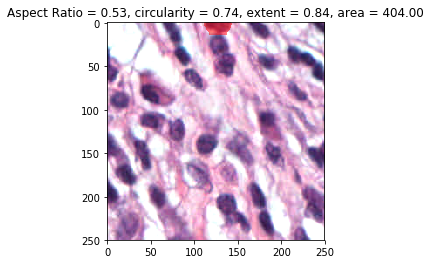

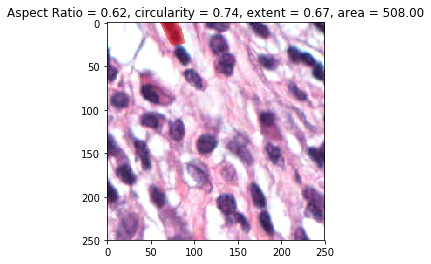

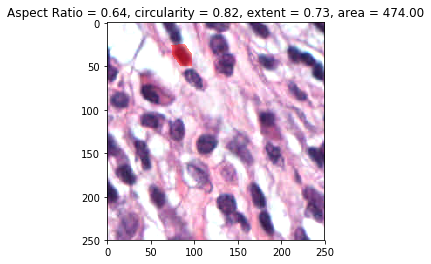

...

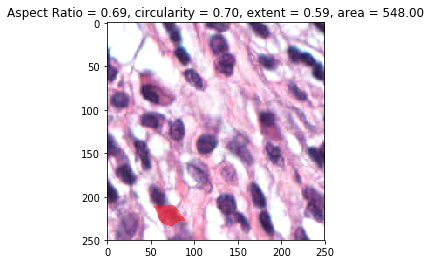

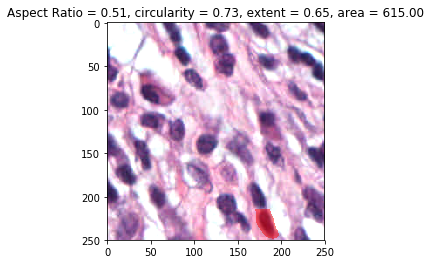

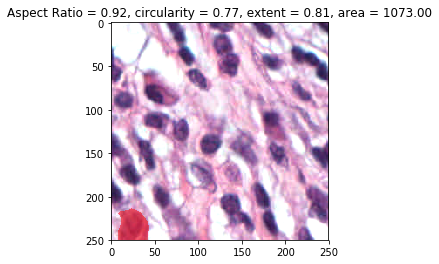

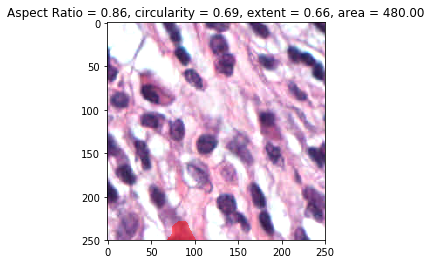

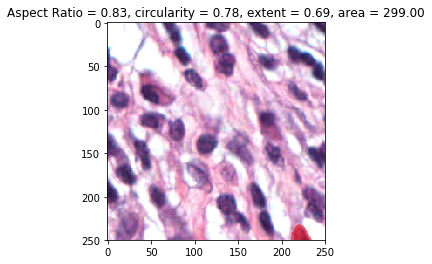

In [22]:
# visualize -- props 1

for prop in props1:
    
    # get elongation features
    aspect = prop.minor_axis_length / prop.major_axis_length
    circularity = (4 * np.pi * prop.area) / (prop.perimeter ** 2)

    instance_mask = np.zeros(lbl_slice1.shape)
    instance_mask[prop.coords[:,0], prop.coords[:,1]] = 1
    
    # mask background so you can overlay
    instance_mask = np.ma.masked_where(instance_mask == 0, instance_mask)
    
    plt.figure()
    plt.imshow(im_slice1)
    plt.imshow(instance_mask, alpha=0.5, interpolation=None, cmap=cmap_single)
    plt.title("Aspect Ratio = %.2f, circularity = %.2f, extent = %.2f, area = %.2f" % 
              (aspect, circularity, prop.extent, prop.area))

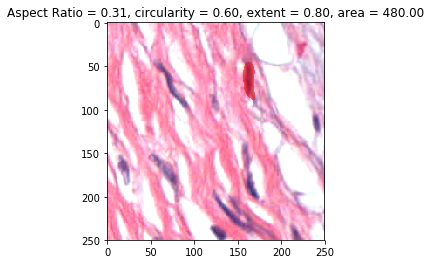

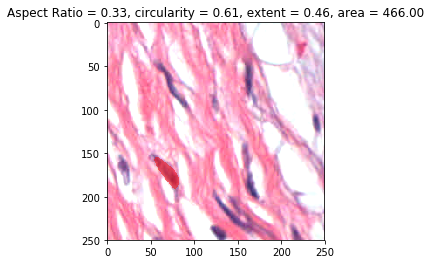

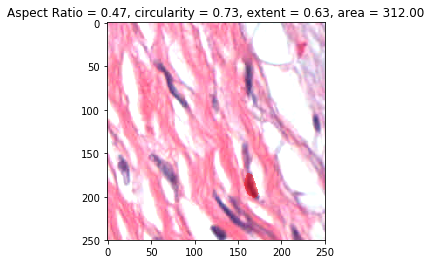

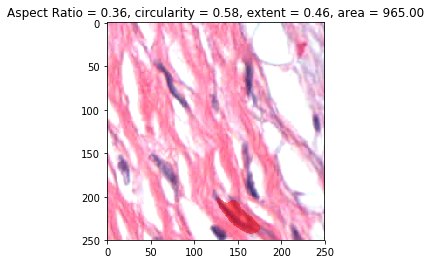

In [23]:
# visualize -- props 2

for prop in props2:
    
    # get elongation features
    aspect = prop.minor_axis_length / prop.major_axis_length
    circularity = (4 * np.pi * prop.area) / (prop.perimeter ** 2)

    instance_mask = np.zeros(lbl_slice2.shape)
    instance_mask[prop.coords[:,0], prop.coords[:,1]] = 1
    
    # mask background so you can overlay
    instance_mask = np.ma.masked_where(instance_mask == 0, instance_mask)
    
    plt.figure()
    plt.imshow(im_slice2)
    plt.imshow(instance_mask, alpha=0.5, interpolation=None, cmap=cmap_single)
    plt.title("Aspect Ratio = %.2f, circularity = %.2f, extent = %.2f, area = %.2f" % 
              (aspect, circularity, prop.extent, prop.area))

In [24]:
# %%===========================================================================
# Refine stromal region region nuclei classification by region props
# =============================================================================

print("\tRefining stroma region nuclei classification using region props ...")

# fibroblasts have low aspect ratio and circularity, while
# lymphocytes have high aspect ratio and circularity, 
# everything else (i.e. mid-range) is vague/unknown
# UPDATE 9 July 2018 --
# Looking at the results, assigning lymphocytes labels
# from stromal regions with unknown circular cells results
# in many false positives, so getting rid of case 2, if it's
# not clearly a fibroblast, ignore it!!
#
aspect_thresh_lower = 0.4
aspect_thresh_upper = 0.55
circ_thresh_lower = 0.7
circ_thresh_upper = 0.8
classname = "stroma"

# Extract features for all stroma region objects
# see: https://en.wikipedia.org/wiki/Shape_factor_(image_analysis_and_microscopy)
# and: http://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.regionprops
thislabel = 0 + (nuclei[..., 0] == codes_new[classname])
thislabel = nuclei[..., 1] * thislabel
props = regionprops(label_image= np.int32(thislabel), coordinates='rc')

if len(props) > 3:
    for propidx, prop in enumerate(props):

        if (propidx % 200) == 0:
            print("\t\tprop %d of %d" % (propidx, len(props)))
        if (prop.minor_axis_length < 2) or (prop.major_axis_length < 2):
            continue

        # get elongation features
        aspect = prop.minor_axis_length / prop.major_axis_length
        circularity = (4 * np.pi * prop.area) / (prop.perimeter ** 2)

        # case1: this is correcty classified as a fibroblast
        if (aspect < aspect_thresh_lower) and (
            circularity < circ_thresh_lower):
            pass 
        
        # UPDATE 9 July 2018 -- do NOT assign lymphocyte labels!!!
        # case2: this should be classified as a lymphocyte    
        # elif (aspect > aspect_thresh_upper) and (
        #     circularity > circ_thresh_upper):        
        #     nuclei[prop.coords[:,0], prop.coords[:,1], 0] = codes_new["lymphocyte"]
        
        # case3: this is ambiguous
        else:
            nuclei[prop.coords[:,0], prop.coords[:,1], 0] = codes_new["background"]

	Refining stroma region nuclei classification using region props ...
		prop 0 of 2607
		prop 200 of 2607
		prop 400 of 2607
		prop 600 of 2607
		prop 800 of 2607
		prop 1000 of 2607
		prop 1200 of 2607
		prop 1400 of 2607
		prop 1600 of 2607
		prop 1800 of 2607
		prop 2000 of 2607
		prop 2200 of 2607
		prop 2400 of 2607
		prop 2600 of 2607


In [25]:
# %%===========================================================================
# Get rid of non-round objects in non-stromal regions
# =============================================================================

# Note that the standards for non-stromal regions are different
# from stromal regions because stroma regions were a "catch all"
# background class that contains a mixture of (mostly) fibroblasts
# and lymphocytes. Also, fibroblasts have very elongate nuclei that 
# whose shape properties resemble artifacts in non-stromal regions
#

print("\tGetting rid of non-round objects in non-stromal regions ...")

aspect_thresh_lower = 0.5
circ_thresh_lower = 0.6
extent_thresh_upper = 0.8 # very large extent means it looks like a rectangle

for cno in unique_nuclei_labels:
    
    classname = codes_new_reverse[cno]
    if ("backg" in classname) or ("stroma" in classname):
        continue
    print("\t\t=== %s ===" % (classname))

    thislabel = 0 + (nuclei[..., 0] == codes_new[classname])
    thislabel = nuclei[..., 1] * thislabel
    props = regionprops(label_image= np.int32(thislabel), coordinates='rc')
    if len(props) < 3:
        continue
    
    for propidx, prop in enumerate(props):  

        if (propidx % 200) == 0:
            print("\t\tprop %d of %d" % (propidx, len(props)))
        if (prop.minor_axis_length < 2) or (prop.major_axis_length < 2):
            continue

        # get elongation features
        aspect = prop.minor_axis_length / prop.major_axis_length
        circularity = (4 * np.pi * prop.area) / (prop.perimeter ** 2)

        # this is ambiguous / probably an artifact
        if (aspect < aspect_thresh_lower) and (
            circularity < circ_thresh_lower) and (
            prop.extent > extent_thresh_upper):
            nuclei[prop.coords[:,0], prop.coords[:,1], 0] = codes_new["background"]

	Getting rid of non-round objects in non-stromal regions ...
		=== tumor ===
		prop 0 of 3688
		prop 200 of 3688
		prop 400 of 3688
		prop 600 of 3688
		prop 800 of 3688
		prop 1000 of 3688
		prop 1200 of 3688
		prop 1400 of 3688
		prop 1600 of 3688
		prop 1800 of 3688
		prop 2000 of 3688
		prop 2200 of 3688
		prop 2400 of 3688
		prop 2600 of 3688
		prop 2800 of 3688
		prop 3000 of 3688
		prop 3200 of 3688
		prop 3400 of 3688
		prop 3600 of 3688
		=== lymphocyte ===
		prop 0 of 1270
		prop 200 of 1270
		prop 400 of 1270
		prop 600 of 1270
		prop 800 of 1270
		prop 1000 of 1270
		prop 1200 of 1270
		=== plasma_cells ===
		=== other_immune ===
		=== necrosis ===
		prop 0 of 536
		prop 200 of 536
		prop 400 of 536
		=== other ===
		prop 0 of 81


visualizing and saving ...


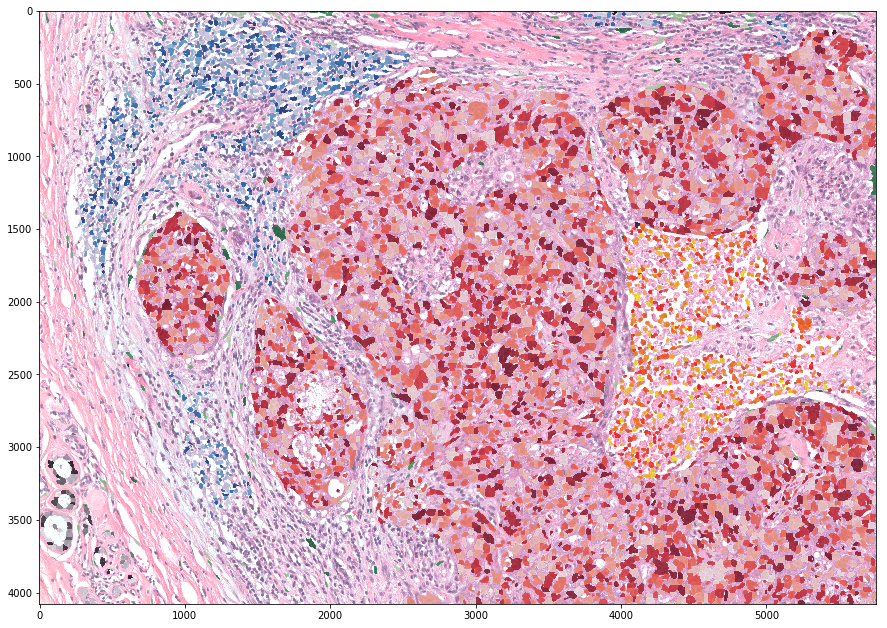

In [26]:
# %%===========================================================================
# visualize overall + save visualization
# =============================================================================

print("visualizing and saving ...")
savename = mask_vis_save_path + imname.split(".")[0] + ".tif"
visualize_nuclei(im= im, instance_mask= nuclei[..., 1], labels_mask= nuclei[..., 0], 
                 cmaps= cmaps, alpha_im= 0.7, alpha_nuclei= 0.7, figsize=(15,15), 
                 savename= savename, show= True)

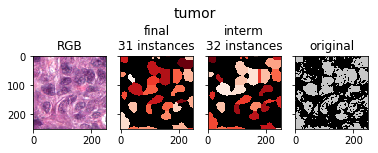

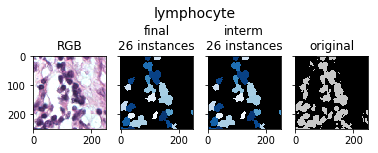

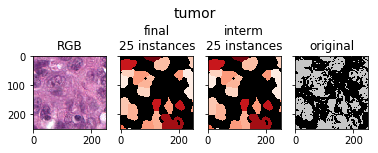

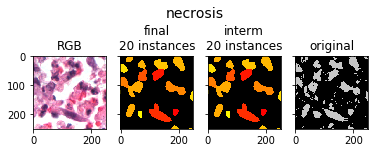

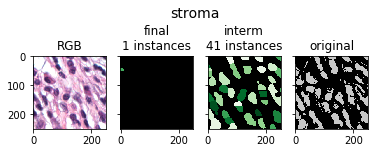

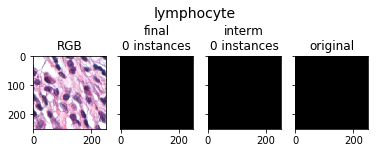

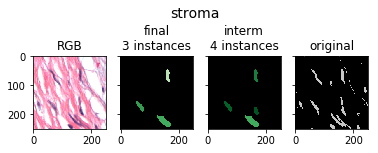

In [27]:
# %%===========================================================================
# visualize upclose
# =============================================================================

snapshots = [((3250, 3250, 3500, 3500), "tumor"),
             ((500, 500, 750, 750), "lymphocyte"),
             ((3250, 4750, 3500, 5000), "tumor"),
             ((2500, 4000, 2750, 4250), "necrosis"),
             ((3500, 1500, 3750, 1750), "stroma"),
             ((3500, 1500, 3750, 1750), "lymphocyte"),
             ((3000, 500, 3250, 750), "stroma"),
            ]

for snapshot in snapshots:  
    (rmin, cmin, rmax, cmax) = snapshot[0]
    classname = snapshot[1]
    im_slice = im[rmin:rmax, cmin:cmax, :]
    lbl_slice_original = nuclei_labels_init[rmin:rmax, cmin:cmax] == codes_new[classname]
    
    thislabel = 0 + (nuclei[rmin:rmax, cmin:cmax, 0] == codes_new[classname])
    lbl_slice = nuclei[rmin:rmax, cmin:cmax, 1] * thislabel
    
    thislabel = 0 + (nuclei_intermediate[rmin:rmax, cmin:cmax, 0] == codes_new[classname])
    lbl_slice_interm = nuclei_intermediate[rmin:rmax, cmin:cmax, 1] * thislabel
    
    # use contiguous labels for better plotting -- new
    lbl_disp = np.zeros(lbl_slice.shape)
    instances = list(np.unique(lbl_slice))
    for i,j in enumerate(instances):
        lbl_disp[lbl_slice == j] = i
        
    # use contiguous labels for better plotting -- intermediate
    lbl_disp_interm = np.zeros(lbl_slice_interm.shape)
    instances_interm = list(np.unique(lbl_slice_interm))
    for i,j in enumerate(instances_interm):
        lbl_disp_interm[lbl_slice_interm == j] = i
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharey=True)
    ax1.imshow(im_slice); ax1.set_title('RGB')
    ax2.imshow(lbl_disp, cmap=cmaps[codes_new[classname]]); 
    ax2.set_title("final\n%d instances" % (len(instances)-1)) # zero is not an instance :)
    ax3.imshow(lbl_disp_interm, cmap=cmaps[codes_new[classname]]); 
    ax3.set_title("interm\n%d instances" % (len(instances_interm)-1)) # zero is not an instance :)
    ax4.imshow(lbl_slice_original, cmap=cmap); ax4.set_title("original") 
    plt.suptitle(classname, fontsize=14, y=0.8)
    plt.show()

In [ ]:
# %%===========================================================================
# Save mask
# =============================================================================

print("\tSaving mask as hickle binary ...")

# convert to int32 for memory efficiency
nuclei = nuclei.astype(np.int32)

# see: https://github.com/telegraphic/hickle
savename = mask_save_path + imname.split(".")[0] + ".hkl"
with open(savename, 'w') as f:
    hkl.dump(nuclei, f) 

In [ ]:
# # %%===========================================================================
# # Load mask
# # =============================================================================

# print("\tLoding mask from hickle binary ...")

# # see: https://github.com/telegraphic/hickle
# savename = mask_save_path + imname.split(".")[0] + ".hkl"
# nuclei = hkl.load(savename) 

In [ ]:
# %%===========================================================================
# Show concept behind overlapping tiles
# =============================================================================

# The idea is to save tiles that overlap horizontally and vertically, so that:
# During training: this acts augmentation
# During inference: only keep predictions from the center of each tile so that
# nuclei that lie at the edge between various tiles don't get misclassified.
# in other words, nuclei get their predictions from tiles in which they are
# located centrally

tilingfig = "../ideas/tiling.png"
plt.figure(figsize=(15,15))
plt.imshow(plt.imread(tilingfig))

In [ ]:
# %%===========================================================================
# Divide into (potentially overlapping) FOVs and save
# =============================================================================

# Get FOV bounds
(M, N, Depth) = im.shape
FOV_bounds = get_fov_bounds(M, N, fov_dims=fov_dims, shift_step=shift_step)
n_fovs = len(FOV_bounds)

# fovidx = 0; fovbounds = FOV_bounds[fovidx]
for fovidx, fovbounds in enumerate(FOV_bounds):
    # slice
    im_slice = im[fovbounds[0]:fovbounds[1], fovbounds[2]:fovbounds[3], ...]
    mask_slice = nuclei[fovbounds[0]:fovbounds[1], fovbounds[2]:fovbounds[3], ...]

    # Ignore masks that have < min_n_instances
    n_instances = len(np.unique(mask_slice[..., 1])) - 1 # -1 to ignore background
    print("\tfov %d of %d: %d instances" %(fovidx, n_fovs, n_instances))
    if n_instances < min_n_instances:
        print("\t\tToo few instances. FOV ignored.")

In [ ]:
# save rgb
savename = input_for_maskrcnn_path_images + imname
imwrite(savename, im_slice)

# save mask
# see: https://github.com/telegraphic/hickle
savename = input_for_maskrcnn_path_labels + imname.split(".")[0] + ".hkl"
with open(savename, 'w') as f:
    hkl.dump(mask_slice, f) 

In [ ]:
# # load mask (confirm it saved correctly)
# tmp = hkl.load(savename) 
# plt.figure(); plt.imshow(tmp[..., 0], cmap=cmap)
# plt.figure(); plt.imshow(tmp[..., 1], cmap=cmap)